# 0.0 IMPORTS

In [1]:
# Importando bibliotecas

import pandas as pd
import numpy  as np
import warnings 

from datetime import datetime

import seaborn           as sns
import matplotlib.pyplot as plt
import folium

from folium                import plugins
from IPython.display       import Image
from IPython.core.display  import HTML

warnings.filterwarnings('ignore')

## 0.1 Helper Functions

In [2]:
def jupyter_settings():
    %matplotlib inline

    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [25, 10]
    #plt.rcParams['font.size'] = 30
    plt.rcParams.update({'font.size': 40})

    display(HTML('<style>.container {width:100% !important;}</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)

    sns.set()

In [3]:
jupyter_settings()

## 0.2 Loading Data

O arquivo utilizado nessa análise pode ser obtido em: https://data.lacity.org/Public-Safety/Crime-Data-from-2020-to-Present/2nrs-mtv8

In [4]:
df_raw = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

In [5]:
df_raw.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


# 1.0 DESCRIÇÃO DOS DADOS

In [6]:
df1 = df_raw.copy()

## 1.1 Renomeando colunas

In [7]:
cols_nova = ['dr_no', 'date_reported', 'date_occurrency', 'time_occurrency', 'area', 'area_name',
       'rpt_dist_no', 'part_1-2', 'crm_cd', 'crm_cd_desc', 'mocodes',
       'vict_age', 'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'location', 'cross_street', 'lat',
       'lon']

In [8]:
#renomeando
df1.columns = cols_nova

## 1.2 Data Dimensions

In [9]:
print('Número de linhas: {}'.format(df1.shape[0]))
print('Número de colunas: {}'.format(df1.shape[1]))

Número de linhas: 668881
Número de colunas: 28


## 1.3 Tipos de dados

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 668881 entries, 0 to 668880
Data columns (total 28 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   dr_no            668881 non-null  int64  
 1   date_reported    668881 non-null  object 
 2   date_occurrency  668881 non-null  object 
 3   time_occurrency  668881 non-null  int64  
 4   area             668881 non-null  int64  
 5   area_name        668881 non-null  object 
 6   rpt_dist_no      668881 non-null  int64  
 7   part_1-2         668881 non-null  int64  
 8   crm_cd           668881 non-null  int64  
 9   crm_cd_desc      668881 non-null  object 
 10  mocodes          576907 non-null  object 
 11  vict_age         668881 non-null  int64  
 12  vict_sex         581251 non-null  object 
 13  vict_descent     581247 non-null  object 
 14  premis_cd        668873 non-null  float64
 15  premis_desc      668548 non-null  object 
 16  weapon_used_cd   233069 non-null  floa

## 1.4 Check NA (%)

In [11]:
df_na = df1.isna().sum().sort_values(ascending=False)/df1.shape[0]*100
df_na

crm_cd_4           99.992375
crm_cd_3           99.746143
crm_cd_2           92.509579
cross_street       83.635206
weapon_used_cd     65.155386
weapon_desc        65.155386
mocodes            13.750428
vict_descent       13.101583
vict_sex           13.100985
premis_desc         0.049785
premis_cd           0.001196
crm_cd_1            0.001196
lat                 0.000000
location            0.000000
status_desc         0.000000
status              0.000000
dr_no               0.000000
date_reported       0.000000
vict_age            0.000000
crm_cd_desc         0.000000
crm_cd              0.000000
part_1-2            0.000000
rpt_dist_no         0.000000
area_name           0.000000
area                0.000000
time_occurrency     0.000000
date_occurrency     0.000000
lon                 0.000000
dtype: float64

In [12]:
# Selecionando colunas
cols_analise = df_na[df_na <= 20].index
cols_analise

Index(['mocodes', 'vict_descent', 'vict_sex', 'premis_desc', 'premis_cd',
       'crm_cd_1', 'lat', 'location', 'status_desc', 'status', 'dr_no',
       'date_reported', 'vict_age', 'crm_cd_desc', 'crm_cd', 'part_1-2',
       'rpt_dist_no', 'area_name', 'area', 'time_occurrency',
       'date_occurrency', 'lon'],
      dtype='object')

In [13]:
df1 = df1[cols_analise]

## 1.5 Tratamento de NA

In [14]:
df1['mocodes'].fillna(0, inplace=True)
df1['vict_descent'].fillna('X', inplace=True)
df1['vict_sex'].fillna('X', inplace=True)
df1['premis_desc'].fillna('unknown', inplace=True)
df1['premis_cd'].fillna('unknown', inplace=True)
df1['crm_cd_1'].fillna('unknown', inplace=True)

In [15]:
df1.isna().sum().sort_values(ascending=False)/df1.shape[0]*100

mocodes            0.0
vict_descent       0.0
date_occurrency    0.0
time_occurrency    0.0
area               0.0
area_name          0.0
rpt_dist_no        0.0
part_1-2           0.0
crm_cd             0.0
crm_cd_desc        0.0
vict_age           0.0
date_reported      0.0
dr_no              0.0
status             0.0
status_desc        0.0
location           0.0
lat                0.0
crm_cd_1           0.0
premis_cd          0.0
premis_desc        0.0
vict_sex           0.0
lon                0.0
dtype: float64

## 1.6 Tipagem de dados

In [16]:
df1.dtypes

mocodes             object
vict_descent        object
vict_sex            object
premis_desc         object
premis_cd           object
crm_cd_1            object
lat                float64
location            object
status_desc         object
status              object
dr_no                int64
date_reported       object
vict_age             int64
crm_cd_desc         object
crm_cd               int64
part_1-2             int64
rpt_dist_no          int64
area_name           object
area                 int64
time_occurrency      int64
date_occurrency     object
lon                float64
dtype: object

In [17]:
# Mudança para formato de data
df1['date_reported'] = pd.to_datetime(df1['date_reported'])
df1['date_occurrency'] = pd.to_datetime(df1['date_reported'])

# Acrescentando dois pontos nas horas
df1['time_occurrency'] = df1['time_occurrency'].astype(str)
df1['time_occurrency'] = df1['time_occurrency'].apply(lambda x: x[:-2] + ":" + x[-2:])

# Mudança para formato string
df1['rpt_dist_no'] = df1['rpt_dist_no'].astype(str)
df1['premis_cd'] = df1['premis_cd'].astype(str)
df1['crm_cd_1'] = df1['crm_cd_1'].astype(str)
df1['part_1-2'] = df1['part_1-2'].astype(str)
df1['crm_cd'] = df1['crm_cd'].astype(str)
df1['dr_no'] = df1['dr_no'].astype(str)
df1['area'] = df1['area'].astype(str)

In [18]:
df1.dtypes

mocodes                    object
vict_descent               object
vict_sex                   object
premis_desc                object
premis_cd                  object
crm_cd_1                   object
lat                       float64
location                   object
status_desc                object
status                     object
dr_no                      object
date_reported      datetime64[ns]
vict_age                    int64
crm_cd_desc                object
crm_cd                     object
part_1-2                   object
rpt_dist_no                object
area_name                  object
area                       object
time_occurrency            object
date_occurrency    datetime64[ns]
lon                       float64
dtype: object

## 1.7 Adicionando colunas

In [19]:
dic = {
 'A': 'Other Asian',
 'B': 'Black',
 'C': 'Chinese',
 'D': 'Cambodian',
 'F': 'Filipino',
 'G': 'Guamanian',
 'H': 'Hispanic/Latin/Mexican',
 'I': 'American Indian/Alaskan Native',
 'J': 'Japanese',
 'K': 'Korean',
 'L': 'Laotian',
 'O': 'Other',
 'P': 'Pacific Islander',
 'S': 'Samoan',
 'U': 'Hawaiian',
 'V': 'Vietnamese',
 'W': 'White',
 'X': 'Unknown',
 'Z': 'Asian Indian'
}

dim_vict_descent = pd.DataFrame([dic]).T.reset_index()
colunas = ['vict_descent', 'vict_descent_desc']
dim_vict_descent.columns = colunas
dim_vict_descent

,vict_descent,vict_descent_desc
0,A,Other Asian
1,B,Black
2,C,Chinese
3,D,Cambodian
4,F,Filipino
5,G,Guamanian
6,H,Hispanic/Latin/Mexican
7,I,American Indian/Alaskan Native
8,J,Japanese
9,K,Korean


In [20]:
df1 = pd.merge(df1, dim_vict_descent, on='vict_descent', how='left')

In [21]:
df1 = df1.drop(columns=['vict_descent'])

In [22]:
df1.columns

Index(['mocodes', 'vict_sex', 'premis_desc', 'premis_cd', 'crm_cd_1', 'lat',
       'location', 'status_desc', 'status', 'dr_no', 'date_reported',
       'vict_age', 'crm_cd_desc', 'crm_cd', 'part_1-2', 'rpt_dist_no',
       'area_name', 'area', 'time_occurrency', 'date_occurrency', 'lon',
       'vict_descent_desc'],
      dtype='object')

# 2.0 Análise exploratória

In [23]:
num_attributes = df1.select_dtypes(include=['int64', 'float64',])
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64', 'datetime64[ns]'])

## 2.1 Análise estatística

In [24]:
# Tendência central - média e mediana
ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

# Dispersão - desvio padrão, min, max, assimetria, curtose
d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max()-x.min())).T
d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

# Concatenate
m = pd.concat([d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'assimetria', 'curtose']
m

,attributes,min,max,range,mean,median,std,assimetria,curtose
0,lat,0.0000,34.3343,34.3343,33.958083,34.0583,1.982980,-17.012549,288.349302
1,vict_age,-2.0000,120.0000,122.0000,29.999662,31.0000,21.669342,0.106004,-0.741468
2,lon,-118.6676,0.0000,118.6676,-117.952966,-118.3214,6.877822,17.087545,290.052869


A partir das métricas ácima, da variável vict_age (idade da vitima), é possível notar que não há desvio na distribuição, uma vez que a assimetria se encontra próximo de 0, além disso, a média e mediana apresentam valores próximos, ratificando a simetria da distribuição. Entretanto, uma curtose negativa pode indicar um desvio do comportamento de uma distribuição normal, quando a curtose é igual a 3. 

### 1.7.2 Análise de variáveis categóricas

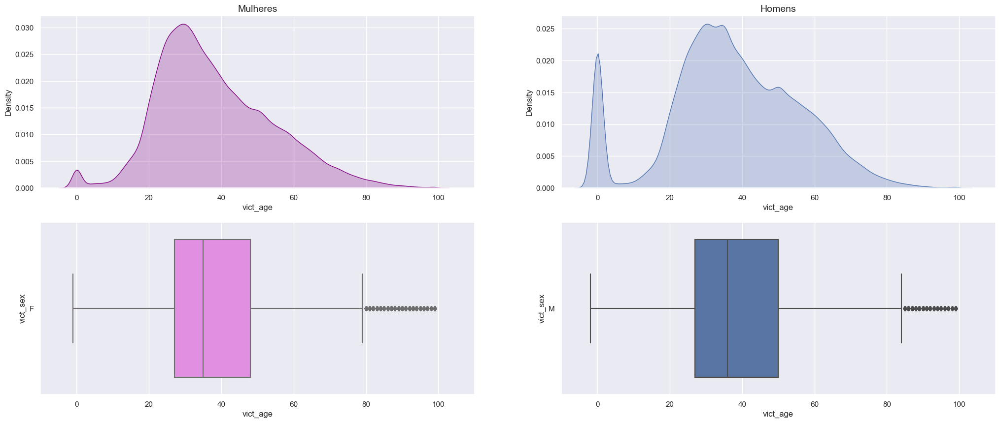

In [25]:
df1_fem = df1[df1['vict_sex'] == 'F']
df1_mas = df1[df1['vict_sex'] == 'M']

plt.subplot(2, 2, 1)
sns.kdeplot(data=df1_fem, x=df1_fem['vict_age'], shade=True, color='Purple');
plt.title('Mulheres', fontsize=14)
plt.xlim([-10, 110]);

plt.subplot(2, 2, 3)
sns.boxplot(x=df1_fem['vict_age'], y=df1_fem['vict_sex'], data=df1_fem, color='Violet');
plt.xlim([-10, 110]);

plt.subplot(2, 2, 2)
sns.kdeplot(data=df1_mas, x=df1_mas['vict_age'], shade=True);
plt.title('Homens', fontsize=14)
plt.xlim([-10, 110]);

plt.subplot(2, 2, 4)
sns.boxplot(x=df1_mas['vict_age'], y=df1_mas['vict_sex'], data=df1_mas);
plt.xlim([-10, 110]);

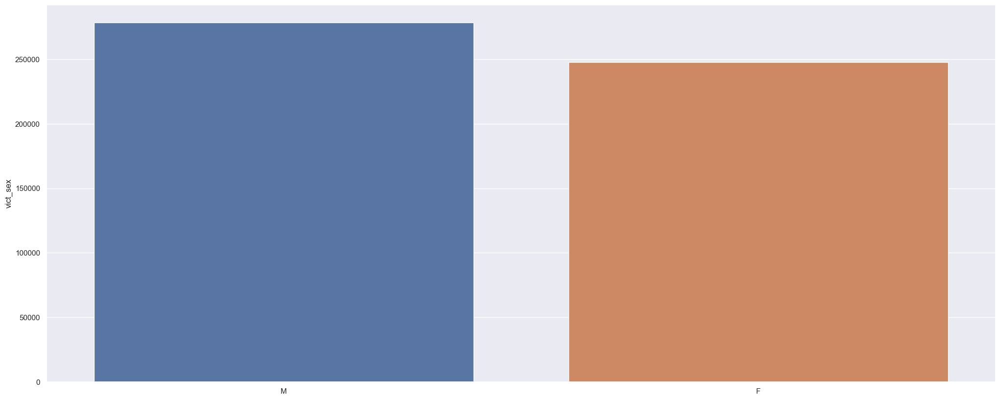

In [26]:
vict_sex_count = df1.loc[(df1['vict_sex']=='M') | (df1['vict_sex']=='F')]['vict_sex'].value_counts()
vict_sex_count.index
sns.barplot(x=vict_sex_count.index, y=vict_sex_count);

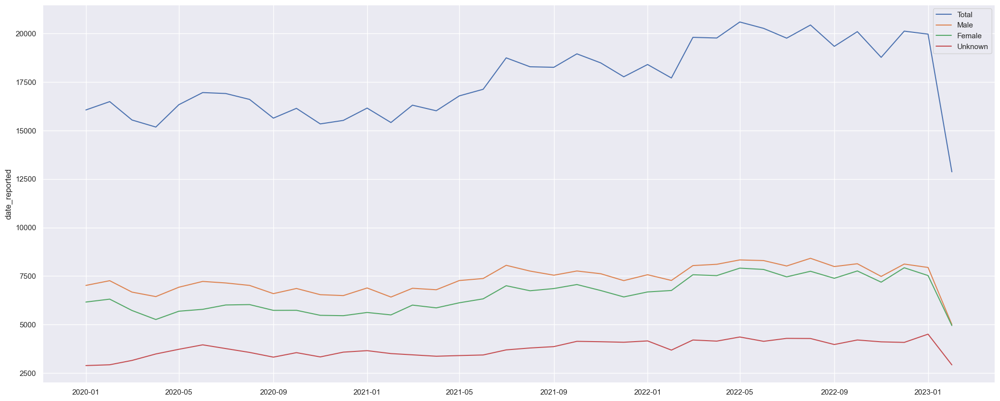

In [27]:
# Quantidade total de crimes
crimes_year = pd.to_datetime(df1['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year.index, y=crimes_year, label='Total');

# Quantidade de crimes relacionados a homens
crimes_year_m = pd.to_datetime(df1.loc[df1['vict_sex']=='M']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_m.index, y=crimes_year_m, label='Male');

# Quantidade de crimes relacionados a mulheres
crimes_year_f = pd.to_datetime(df1.loc[df1['vict_sex']=='F']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_f.index, y=crimes_year_f, label='Female');

# Quantidade de crimes relacionados a genero "desconhecido"
crimes_year_x = pd.to_datetime(df1.loc[df1['vict_sex']=='X']['date_reported'].dt.strftime('%Y-%m')).value_counts().sort_index()
sns.lineplot(x=crimes_year_x.index, y=crimes_year_x, label='Unknown');

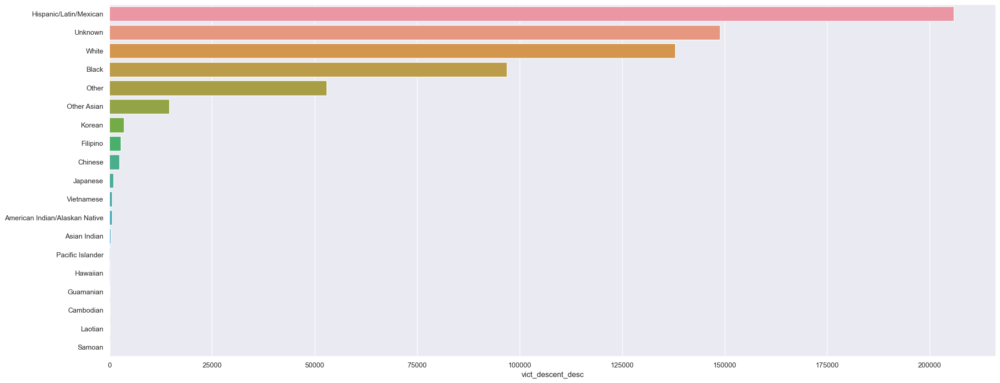

In [28]:
vict_descent_count = df1['vict_descent_desc'].value_counts()
sns.barplot(x=vict_descent_count, y=vict_descent_count.index);

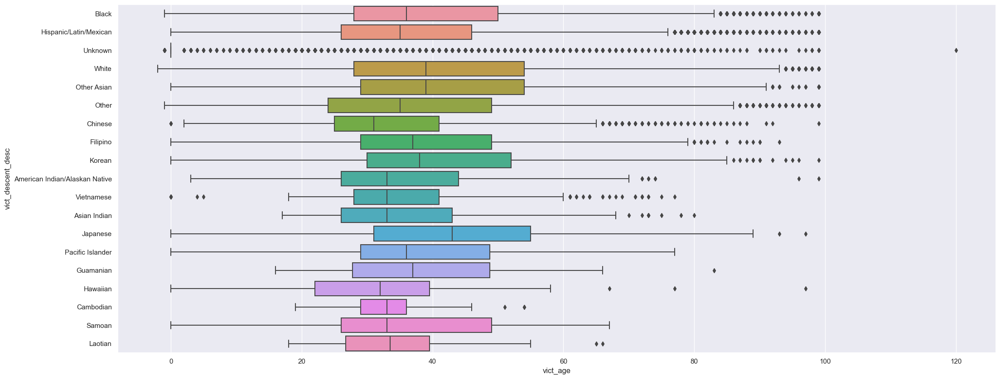

In [29]:
sns.boxplot(x=df1['vict_age'], y=df1['vict_descent_desc']);

## 2.2 Análise Geográfica

In [30]:
coordenadas = []
for lat, long in zip(df1.lat.values, df1.lon.values):
    coordenadas.append([lat, long])

In [31]:
mapa = folium.Map(location   = [35.27378775813666, -117.5595772602388],
                  zoom_start = 7,
                  tiles      = 'OpenStreetMap'
                 )

In [32]:
mapa.add_child(plugins.HeatMap(coordenadas))

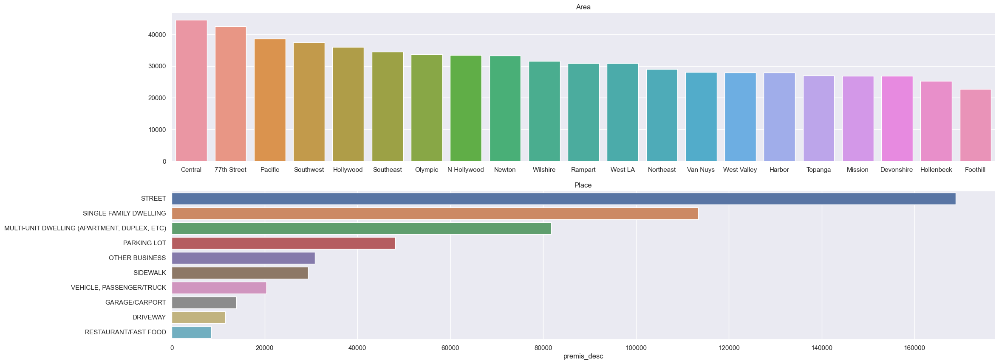

In [33]:
crimes_area = df1['area_name'].value_counts()
crimes_premis = df1['premis_desc'].value_counts().head(10)

plt.subplot(2, 1, 1)
sns.barplot(x=crimes_area.index, y=crimes_area);
plt.title('Area')
plt.ylabel('');
plt.xlabel('');

plt.subplot(2, 1, 2)
sns.barplot(x=crimes_premis, y=crimes_premis.index);
plt.title('Place');

## 2.3 Análise período do dia

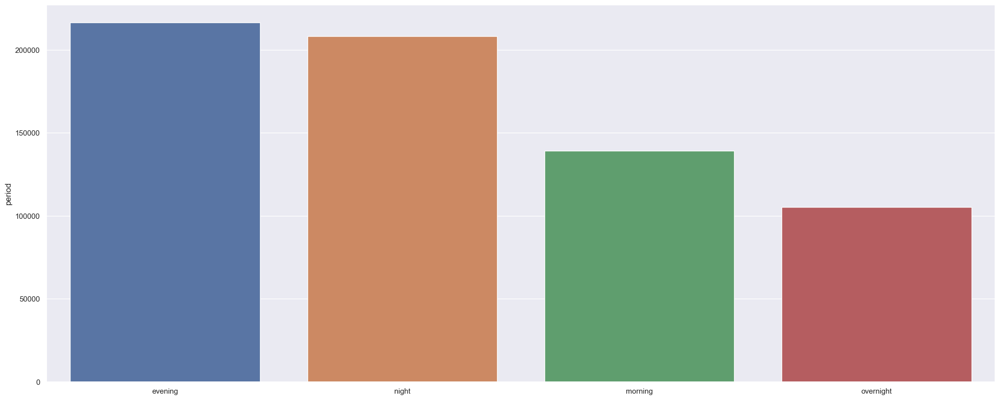

In [34]:
# Definindo periodos para serem analisados
df1['period'] = df1['time_occurrency'].apply(lambda x: 'overnight'   if x.split(':')[0] in ['0', '1', '2', '3', '4', '5']       else 
                                                       'morning'     if x.split(':')[0] in ['6', '7', '8', '9', '10', '11']     else
                                                       'evening'     if x.split(':')[0] in ['12', '13', '14', '15', '16', '17'] else
                                                       'night'       if x.split(':')[0] in ['18', '19', '20', '21', '22', '23'] else 'overnight')
crimes_period = df1['period'].value_counts()
sns.barplot(x=crimes_period.index, y=crimes_period);

## 2.4 TOP 10 - Crimes mais cometidos

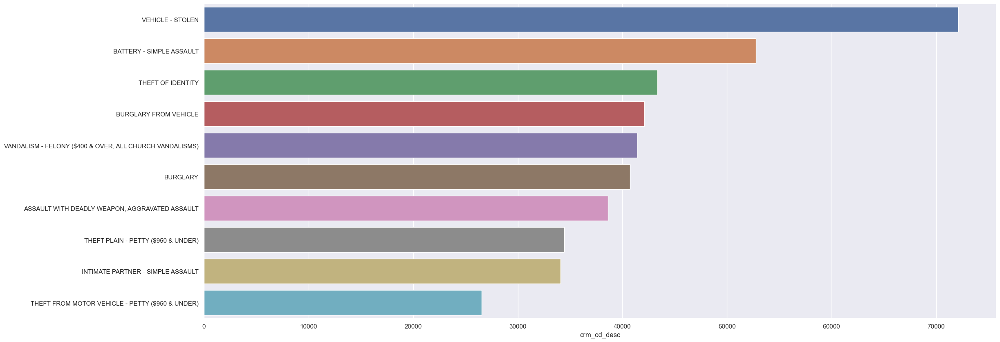

In [35]:
crimes_desc = df1['crm_cd_desc'].value_counts().head(10)
sns.barplot(x=crimes_desc, y=crimes_desc.index);